# Set up

In [1]:
import numpy as np 
import pandas as pd 
import cv2
from PIL import Image 
import pathlib
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import Sequential,Model
from tensorflow.keras.applications import InceptionResNetV2
import tensorflow_addons as tfa
from tensorflow_addons.metrics import F1Score
from tensorflow.keras.layers import Dense, Flatten, GlobalAveragePooling2D, Dropout

gpus = tf.config.experimental.list_physical_devices('GPU')
tf.config.experimental.set_memory_growth(gpus[0], True)
sess_config = tf.compat.v1.ConfigProto(gpu_options = tf.compat.v1.GPUOptions(per_process_gpu_memory_fraction=0.7), allow_soft_placement = True)
sess = tf.compat.v1.Session(config=sess_config)
tf.compat.v1.keras.backend.set_session(sess)

In [2]:
IMG_WIDTH=300
IMG_HEIGHT=300
IMG_DIM = (IMG_WIDTH, IMG_HEIGHT)
BATCH_SIZE = 12
TRAIN_DIR = 'G:/Github/standford-dogs/cropped/train'
VAL_DIR = 'G:/Github/standford-dogs/cropped/validation'
TEST_DIR = 'G:/Github/Dogs_breed_classification/test'

In [3]:
save_path = 'G:/Github/Dogs_breed_classification/Incepresnetv2_5/'

In [4]:
from tensorflow.keras.applications.inception_resnet_v2 import preprocess_input
from tensorflow.keras.preprocessing.image import ImageDataGenerator
            
data_generator_no_aug = ImageDataGenerator(preprocessing_function=preprocess_input)

In [41]:
#most importantly,shuffle=false because shuffle=true is the default mode..

train_generator = data_generator_no_aug .flow_from_directory(
                                        directory=TRAIN_DIR,
                                        target_size=IMG_DIM,
                                        shuffle=False, 
                                        batch_size=BATCH_SIZE,
                                        class_mode='categorical')

train_filenames = train_generator.filenames
trainnb_samples = len(train_filenames)

validation_generator = data_generator_no_aug.flow_from_directory(
                                        directory=VAL_DIR,
                                        target_size=IMG_DIM,
                                        shuffle=False,
                                        batch_size=BATCH_SIZE,                            
                                        class_mode='categorical')

val_filenames = validation_generator.filenames
valnb_samples = len(val_filenames)

test_generator = data_generator_no_aug.flow_from_directory(
                                        directory=TEST_DIR,
                                        shuffle=False,
                                        target_size=IMG_DIM,
                                        class_mode='categorical')

Found 18522 images belonging to 120 classes.
Found 2058 images belonging to 120 classes.
Found 4 images belonging to 1 classes.


# Get predictions

In [42]:
from tensorflow.keras.models import Model
import tensorflow.keras as keras

resnet = InceptionResNetV2(include_top=False, weights='imagenet', input_shape=(IMG_HEIGHT,IMG_WIDTH,3),pooling='avg')

output = resnet.layers[-1].output
output = tf.keras.layers.Flatten()(output)
resnet = Model(resnet.input, output)
res_name = []
for layer in resnet.layers:
    res_name.append(layer.name)

In [43]:
set_trainable = False
for layer in resnet.layers:
    if layer.name in res_name[-447:]:
        set_trainable = True
    if set_trainable:
        layer.trainable = True
    else:
        layer.trainable = False

In [44]:

num_classes = 120

model = Sequential()
model.add(resnet)
model.add(Dense(1024, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(1024, activation='relu'))
model.add(Dropout(0.4))
model.add(Dense(num_classes, activation='softmax'))

model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
model (Model)                (None, 1536)              54336736  
_________________________________________________________________
dense (Dense)                (None, 1024)              1573888   
_________________________________________________________________
dropout (Dropout)            (None, 1024)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 1024)              1049600   
_________________________________________________________________
dropout_1 (Dropout)          (None, 1024)              0         
_________________________________________________________________
dense_2 (Dense)              (None, 120)               123000    
Total params: 57,083,224
Trainable params: 48,604,088
Non-trainable params: 8,479,136
____________________________________

In [45]:
model.load_weights(save_path)

In [46]:
adam = tf.keras.optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer = adam, 
              loss = 'categorical_crossentropy', 
              metrics=['accuracy',tfa.metrics.F1Score(num_classes=num_classes)])

In [47]:
test_predict = model.predict(test_generator)

In [48]:
train_predict = model.predict(train_generator,steps = 
                                   np.ceil(trainnb_samples/BATCH_SIZE))
val_predict = model.predict(validation_generator,steps = 
                                   np.ceil(valnb_samples/BATCH_SIZE))

In [6]:
import pickle

In [49]:
with open('G:/Github/Dogs_breed_classification/output/train-prediction_name.txt', 'w') as file:
    for line in train_filenames:
        file.write(line+'\n')

In [50]:
with open('G:/Github/Dogs_breed_classification/output/val-prediction_name.txt', 'w') as file:
    for line in val_filenames:
        file.write(line+'\n')

In [51]:
train_path = 'G:/Github/Dogs_breed_classification/output/train-prediction.pkl'
val_path = 'G:/Github/Dogs_breed_classification/output/val-prediction.pkl'
test_path = 'G:/Github/Dogs_breed_classification/output/test-prediction.pkl'

In [52]:
train_predict.dump(train_path)

In [53]:
val_predict.dump(val_path)

In [54]:
test_predict.dump(test_path)

In [9]:
#can load with pickle.load

file = open(train_path,'rb')
train_predict = pickle.load(file)

In [8]:
file = open(val_path,'rb')
val_predict = pickle.load(file)

file = open(test_path,'rb')
test_predict = pickle.load(file)

In [18]:
# get classes mapping

class_to_indice = train_generator.class_indices
indice_to_class = {v: k for k, v in train_generator.class_indices.items()}

In [39]:
classes_name = list(indice_to_class.values())

In [20]:
train_labels = [class_to_indice[item.split('\\')[0]] for item in train_filenames]

In [22]:
val_labels = [class_to_indice[item.split('\\')[0]] for item in val_filenames]

In [55]:
train_top1_pred = list(np.argmax(train_predict, axis=1))

In [70]:
val_top1_pred = list(np.argmax(val_predict, axis=1))

# Plot confusion matrix

In [61]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

In [57]:
train_cm = confusion_matrix(train_labels,train_top1_pred)

In [71]:
val_cm = confusion_matrix(val_labels,val_top1_pred)

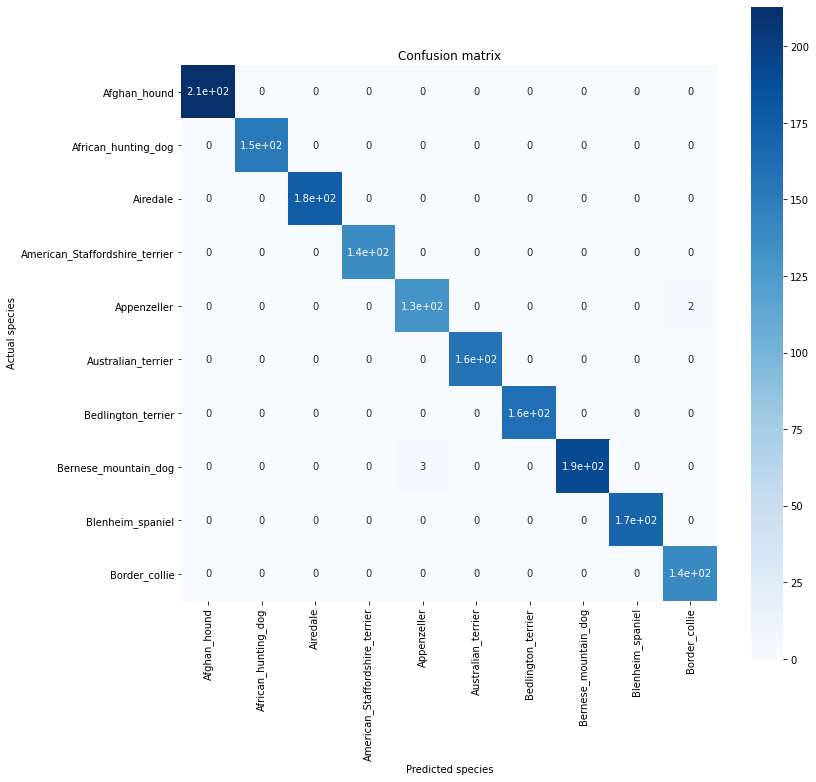

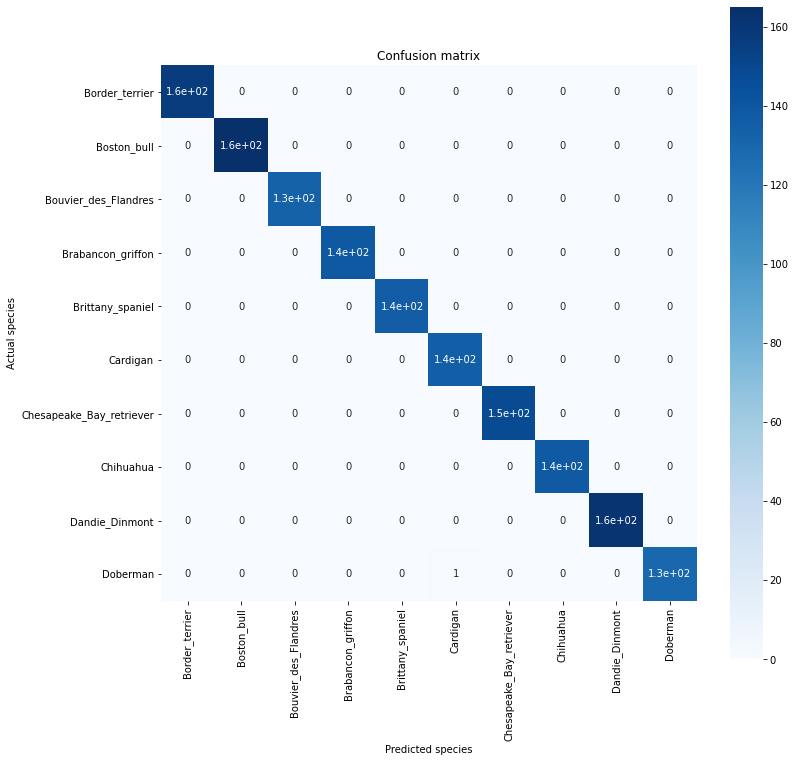

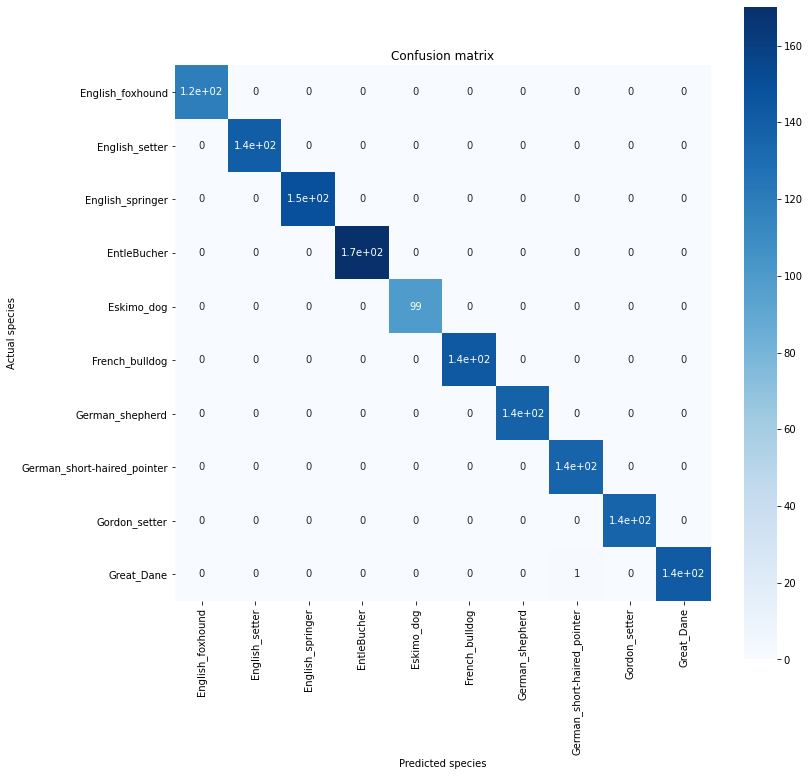

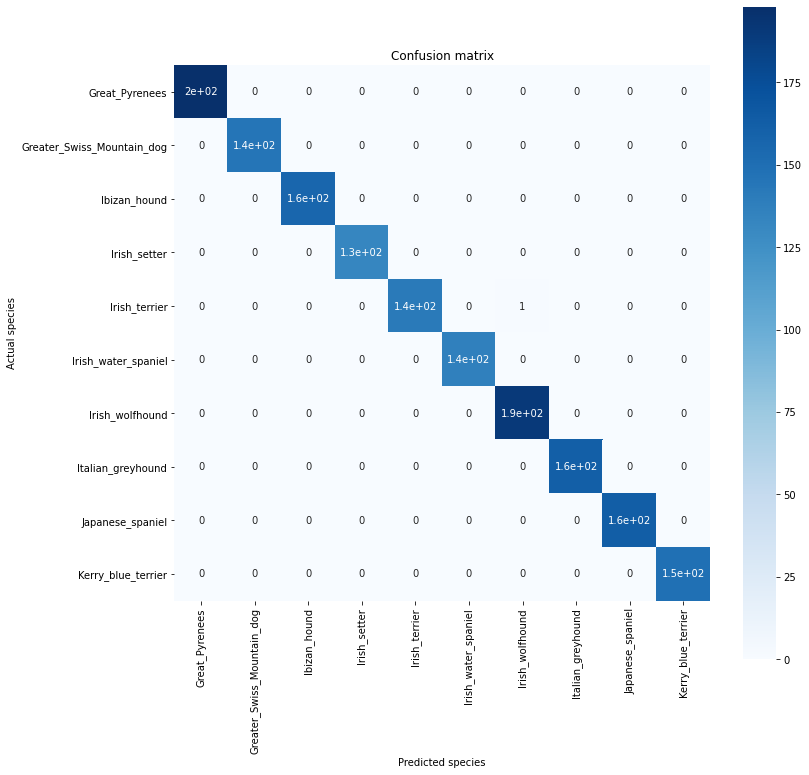

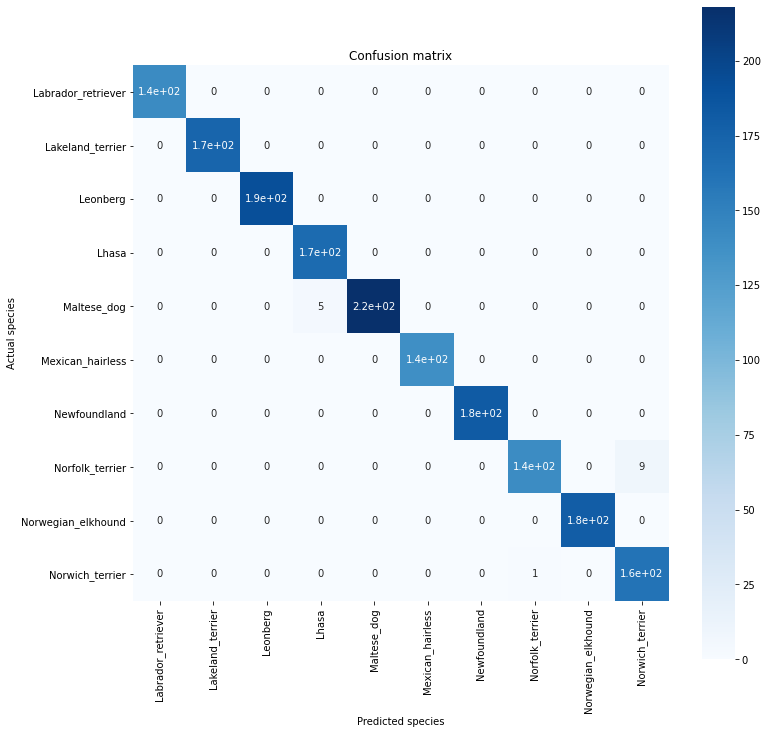

...

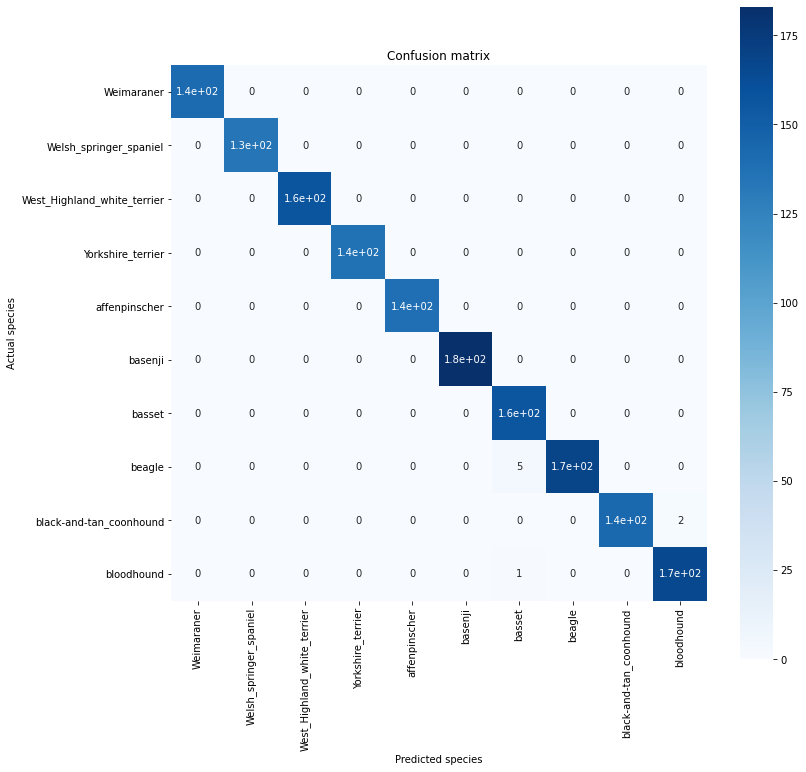

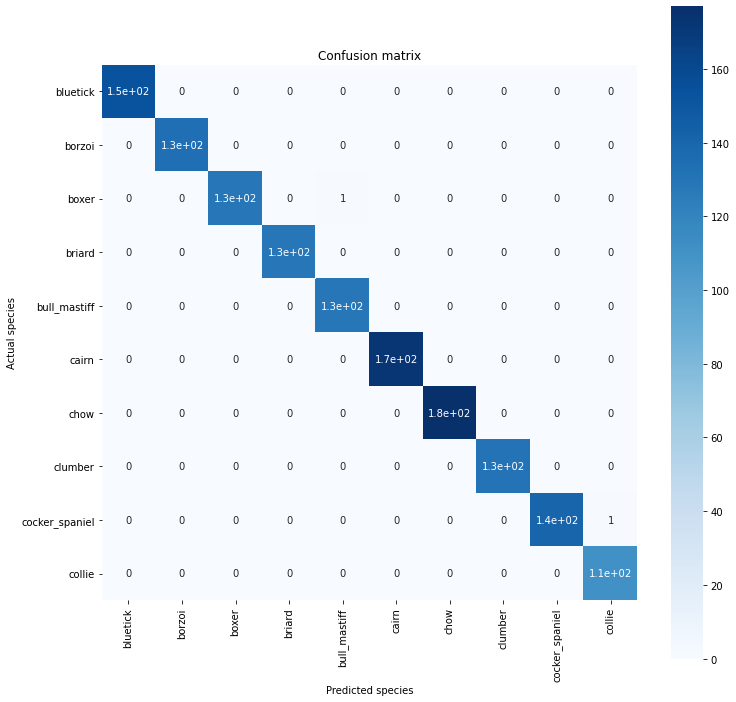

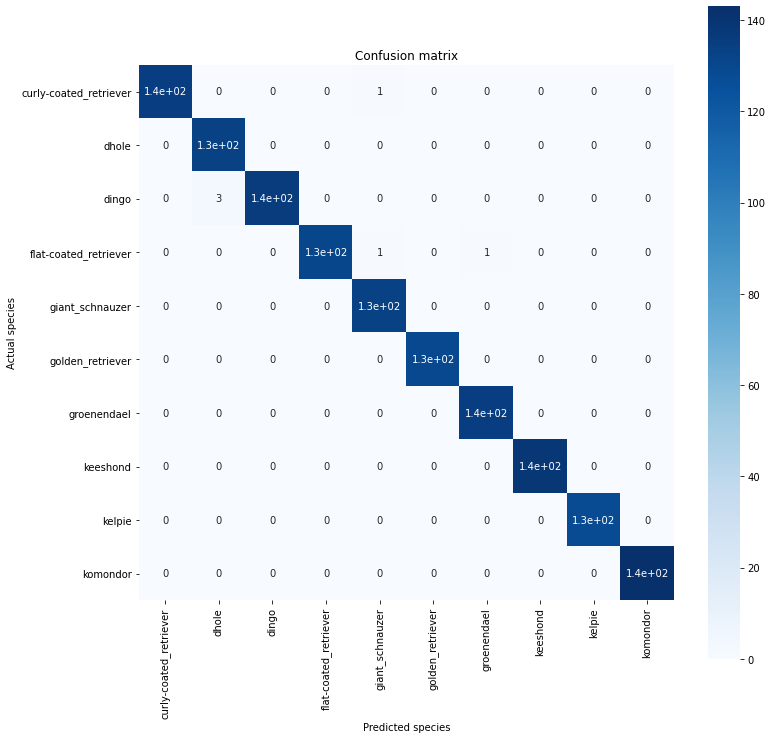

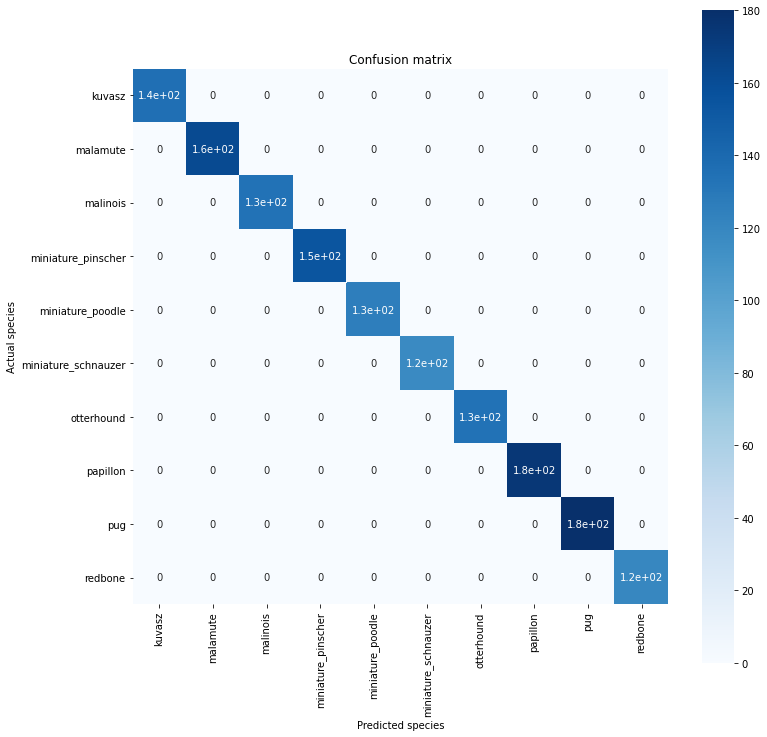

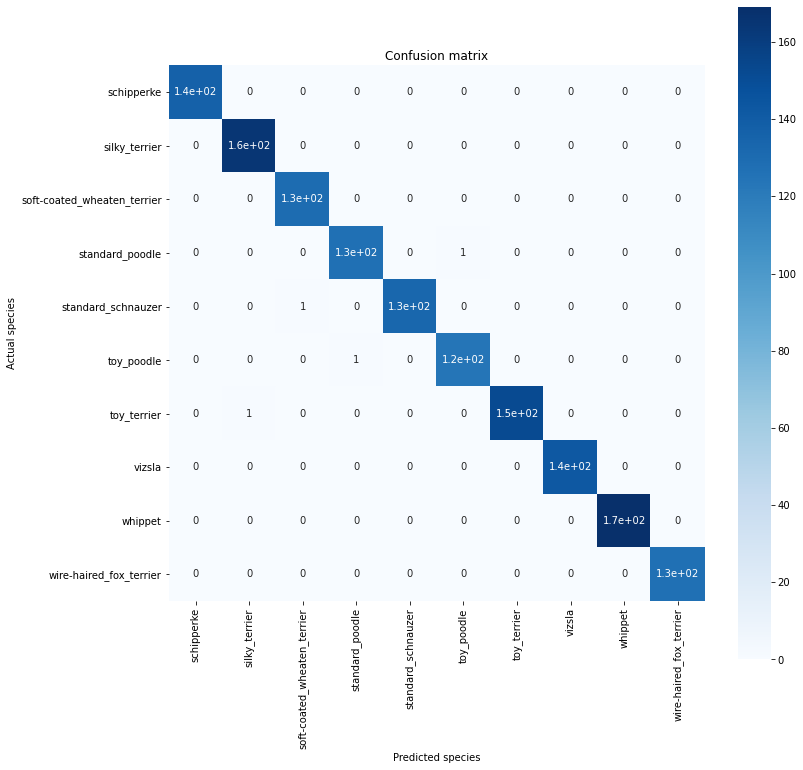

In [69]:
# plot train confusion matrix
for i in range(12):
    plt.figure(figsize=(12,12))
    sns.heatmap(train_cm[i*10:i*10+10,i*10:i*10+10], cmap=plt.cm.Blues, annot=True, square=True,
               xticklabels=classes_name[i*10:i*10+10],
               yticklabels=classes_name[i*10:i*10+10])
    plt.xlabel('Predicted species')
    plt.ylabel('Actual species')
    plt.title('Confusion matrix');

The training confusion matrix looks perfect because our algo tends to overfit

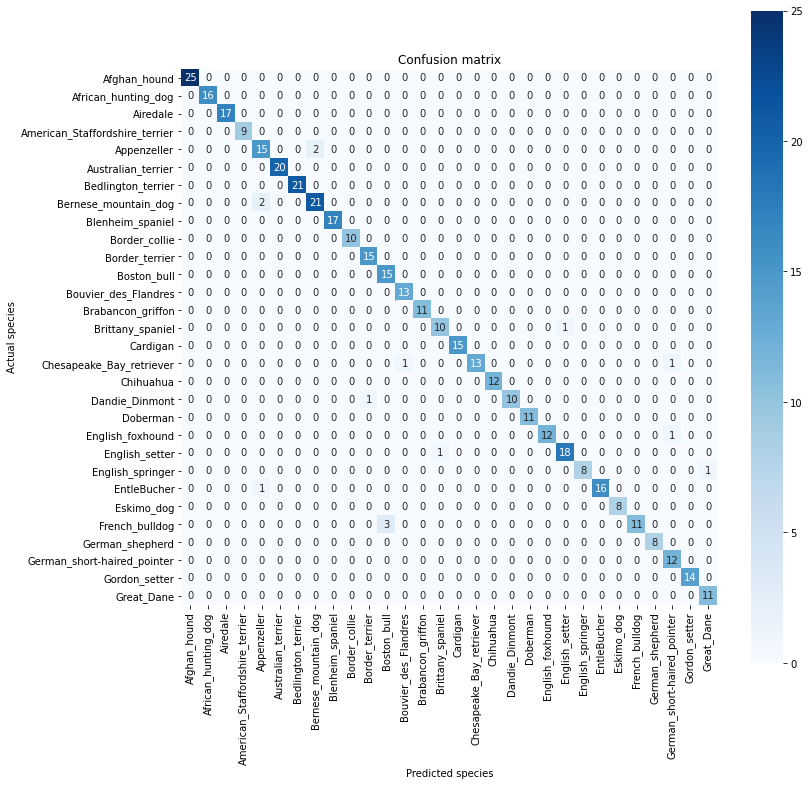

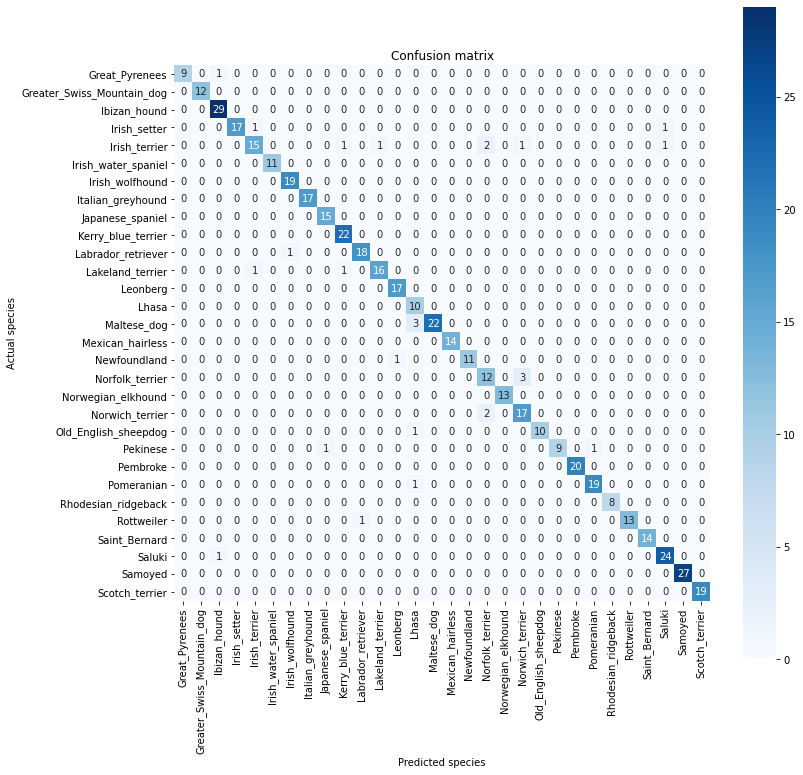

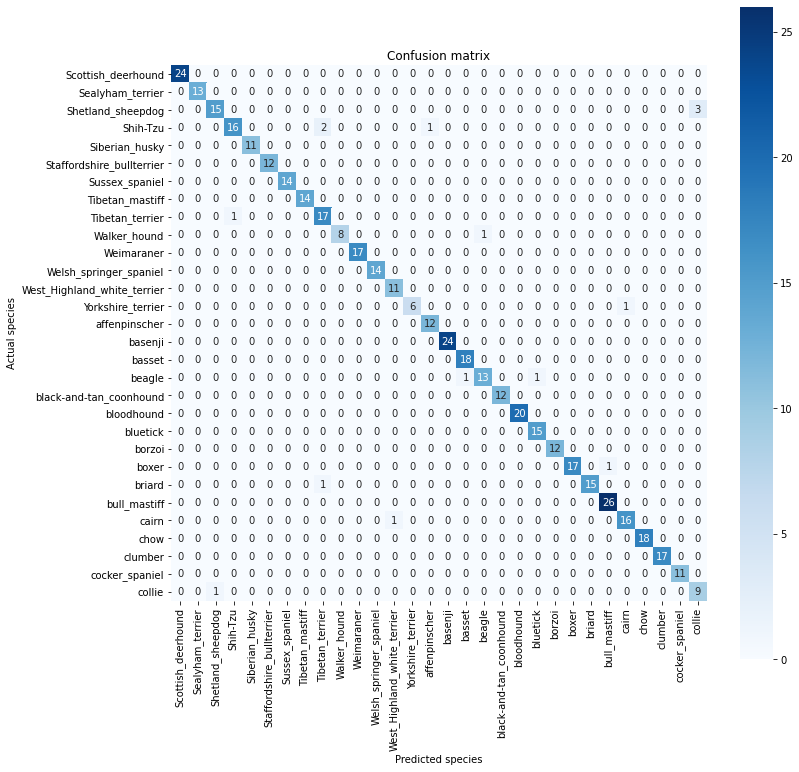

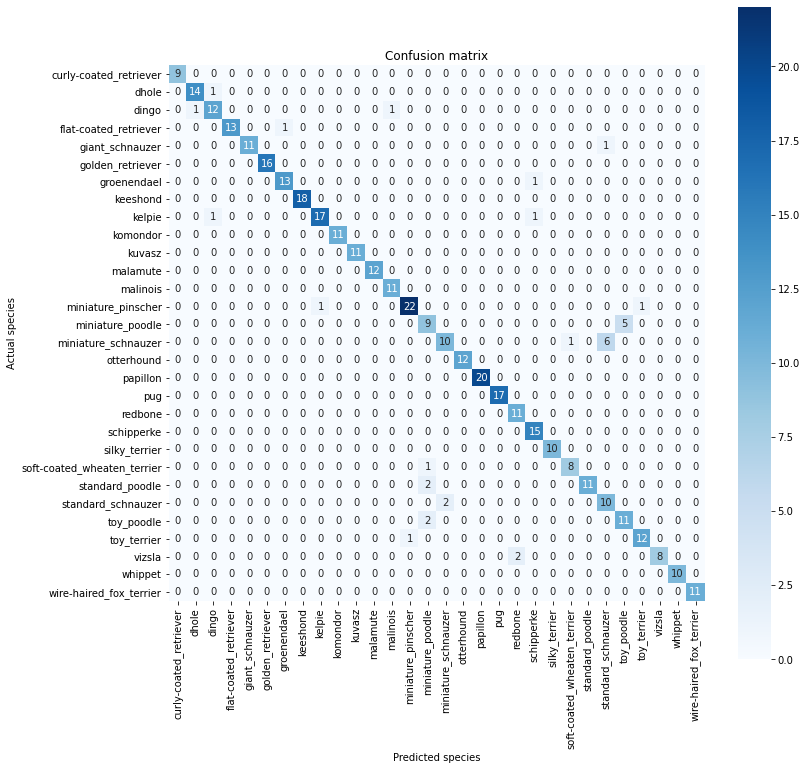

In [73]:
factor=30

for i in range(4):
    plt.figure(figsize=(12,12))
    sns.heatmap(val_cm[i*factor:i*factor+factor,i*factor:i*factor+factor], cmap=plt.cm.Blues, annot=True, square=True,
               xticklabels=classes_name[i*factor:i*factor+factor],
               yticklabels=classes_name[i*factor:i*factor+factor])
    plt.xlabel('Predicted species')
    plt.ylabel('Actual species')
    plt.title('Confusion matrix');

We observe that the terrier family has many mistakes in classification

so does bull dogs (french bull, boston bull)

and other similar types of dogs

# Get the predictions of our test pictures

In [81]:
prob_test = np.sort(test_predict,axis=1)
name_test = np.argsort(test_predict, axis=1)
prob_names = prob_test[:,-3:].tolist()
names = name_test[:,-3:].tolist()
names = [[indice_to_class[i] for i in n] for n in names]

In [99]:
for i,n,p in zip(range(1,5),names,prob_names):
    for nn, pp in zip(n[::-1],p[::-1]):
        print(i,nn,pp)

1 malinois 0.9913801550865173
1 Great_Dane 0.007353784050792456
1 dingo 0.0005881184479221702
2 kelpie 0.6233641505241394
2 bluetick 0.36779433488845825
2 German_short-haired_pointer 0.00478689931333065
3 redbone 0.6614616513252258
3 Rhodesian_ridgeback 0.32326358556747437
3 malinois 0.0049292705953121185
4 Rhodesian_ridgeback 0.7764126062393188
4 vizsla 0.06866537034511566
4 redbone 0.050418607890605927


In [117]:
test_generator.filenames

['test\\angel-1802.jpg',
 'test\\bree-blessing-1485.jpg',
 'test\\ta-ta-1860.jpg',
 'test\\timo-1668.jpg']

# Plot validation set pictures with top3 prediction

In [178]:
def plot_images(images, classes, prob, names,fontsize=12):
    '''This function takes in four images and plots it with truth and predictions'''
    # Create figure with 2x2 sub-plots.
    fig, axes = plt.subplots(2, 2,figsize=(12,12),sharex=True)
    fig.subplots_adjust(hspace=0.35, wspace=0.35)
   
    for i, ax in enumerate(axes.flat):
        # Plot image.
        ax.imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB), cmap='hsv')    
        title = "Truth: {0}".format(classes[i])
        xlabel = " ".join(["{},{:.1f}%\n".format(breed,p*100) for breed,p in zip(names[i][::-1],prob[i][::-1])])
        # Show the classes as the label on the x-axis.
        ax.set_xlabel(xlabel)
        ax.set_title(title,{"fontsize":fontsize})
        ax.xaxis.label.set_size(fontsize)

        # Remove ticks from the plot.
        ax.set_xticks([])
        ax.set_yticks([])
    
    # Ensure the plot is shown correctly with multiple plots
    # in a single Notebook cell.
    plt.show()

In [104]:
deviate = [t-p for t,p in zip(val_labels,val_top1_pred)]

find pictures that deviates from the truth with your eyes

In [182]:
[(i,d) for i,d in enumerate(deviate) if d != 0 ]

[(41, -39),
 (46, -39),
 (49, -103),
 (50, -39),
 (54, -58),
 (64, -62),
 (66, -62),
 (67, -62),
 (68, -62),
 (69, -79),
 (72, -62),
 (75, -62),
 (78, -37),
 (83, -27),
 (90, -3),
 (95, -3),
 (98, -44),
 (102, -68),
 (104, -68),
 (105, -44),
 (110, -44),
 (121, -68),
 (156, 3),
 (167, 3),
 (169, -30),
 (230, -27),
 (231, -82),
 (243, -62),
 (261, -7),
 (268, -83),
 (275, -37),
 (276, -41),
 (284, -38),
 (292, 4),
 (294, -101),
 (297, -11),
 (308, -99),
 (312, -101),
 (314, 8),
 (319, -25),
 (335, -84),
 (336, -38),
 (338, -59),
 (341, -49),
 (342, -49),
 (345, -49),
 (346, -49),
 (348, -7),
 (350, -49),
 (351, -49),
 (352, -49),
 (355, -49),
 (357, -49),
 (366, 7),
 (386, -7),
 (389, -54),
 (403, 19),
 (407, -34),
 (410, -77),
 (413, -40),
 (415, -77),
 (420, -59),
 (421, 14),
 (428, 14),
 (429, 14),
 (433, -85),
 (435, -76),
 (441, -22),
 (442, -76),
 (446, -22),
 (456, -53),
 (460, -27),
 (461, -33),
 (470, -39),
 (476, -18),
 (482, -56),
 (487, -7),
 (491, -2),
 (505, 27),
 (514, 24

In [113]:
val_filenames[2042:2054]

['wire-haired_fox_terrier\\n02095314_1660.jpg',
 'wire-haired_fox_terrier\\n02095314_1754.jpg',
 'wire-haired_fox_terrier\\n02095314_1884.jpg',
 'wire-haired_fox_terrier\\n02095314_1894.jpg',
 'wire-haired_fox_terrier\\n02095314_1976.jpg',
 'wire-haired_fox_terrier\\n02095314_2038.jpg',
 'wire-haired_fox_terrier\\n02095314_2130.jpg',
 'wire-haired_fox_terrier\\n02095314_2314.jpg',
 'wire-haired_fox_terrier\\n02095314_2803.jpg',
 'wire-haired_fox_terrier\\n02095314_2890.jpg',
 'wire-haired_fox_terrier\\n02095314_293.jpg',
 'wire-haired_fox_terrier\\n02095314_3295.jpg']

In [119]:
idx_s = 2042
idx_e = 2054

In [124]:
filenames_sample = val_filenames[idx_s:idx_e]
class_sample =[i.split('\\')[0] for i in filenames_sample]

In [132]:
sample_images = []
for fn in filenames_sample:
    img = cv2.imread(VAL_DIR+"/"+fn.replace('\\','/'))
    sample_images.append(cv2.resize(img, IMG_DIM))

In [134]:
sample_predict = val_predict[idx_s:idx_e,:]

In [142]:
sorted_pred = np.sort(sample_predict,axis=1)
sorted_pred_indices = np.argsort(sample_predict, axis=1)
prob_top3 = sorted_pred[:,-3:].tolist()
names = sorted_pred_indices[:,-3:].tolist()
names = [[indice_to_class[i] for i in n] for n in names]

In [144]:
prob_top3[:4]

[[1.0326093615731224e-06, 0.10982917249202728, 0.8901692628860474],
 [0.19016307592391968, 0.19265517592430115, 0.19809210300445557],
 [0.0012244426179677248, 0.02255966141819954, 0.9753887057304382],
 [2.8163058551911035e-09, 2.094292597121239e-07, 0.9999997615814209]]

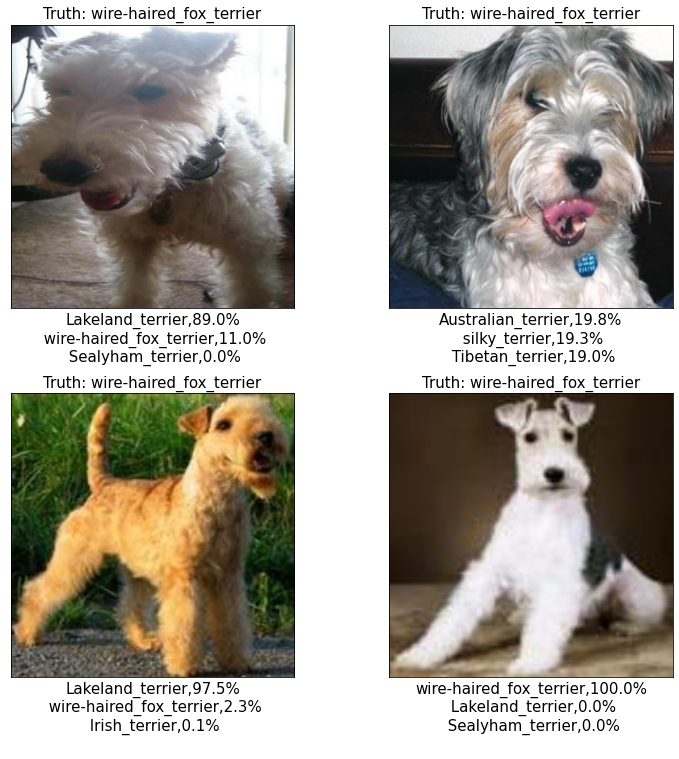

In [160]:
plot_images(sample_images[:4], class_sample[:4], prob_top3[:4], names[:4],15)

In [176]:
#abstract what we did as a function
def get_predict_images_fr_validation(start,end,fontsize=14):
    assert abs(start-end) == 4
    
    #read file names
    filenames_sample = val_filenames[start:end]
    class_sample =[i.split('\\')[0] for i in filenames_sample]
    
    sample_images = []
    for fn in filenames_sample:
        img = cv2.imread(VAL_DIR+"/"+fn.replace('\\','/'))
        sample_images.append(cv2.resize(img, IMG_DIM))
        
    sample_predict = val_predict[start:end,:]
    
    sorted_pred = np.sort(sample_predict,axis=1)
    sorted_pred_indices = np.argsort(sample_predict, axis=1)
    prob_top3 = sorted_pred[:,-3:].tolist()
    names = sorted_pred_indices[:,-3:].tolist()
    names = [[indice_to_class[i] for i in n] for n in names]
    
    plot_images(sample_images, class_sample, prob_top3, names,fontsize)

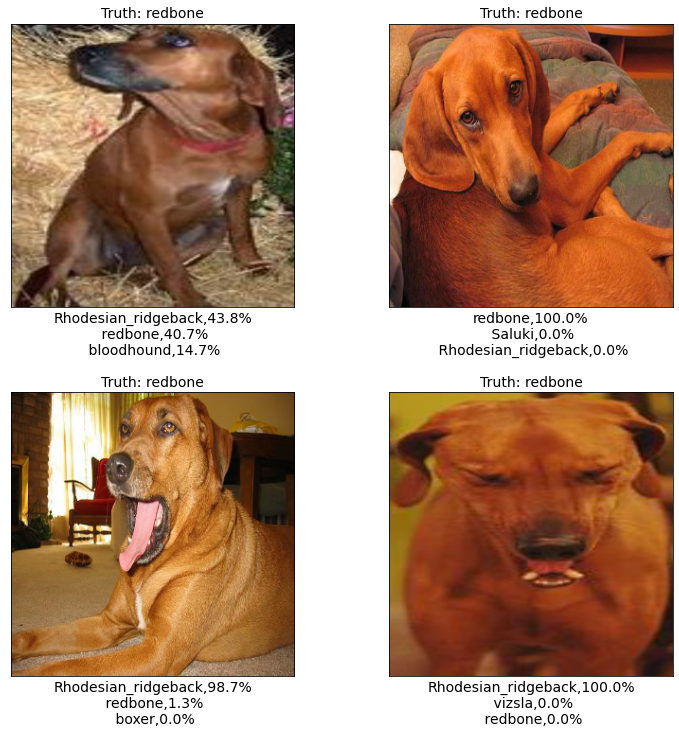

In [163]:
get_predict_images_fr_validation(1885,1889)

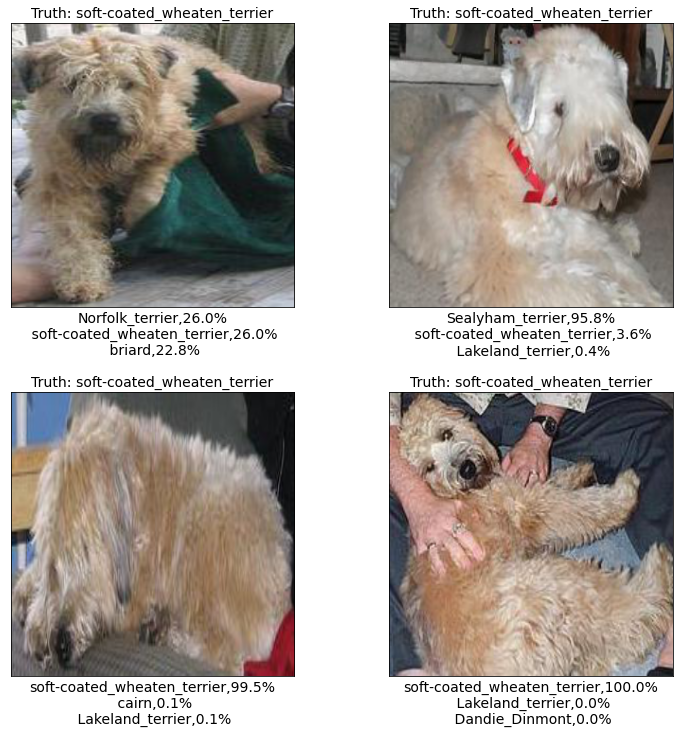

In [165]:
get_predict_images_fr_validation(1940,1944)

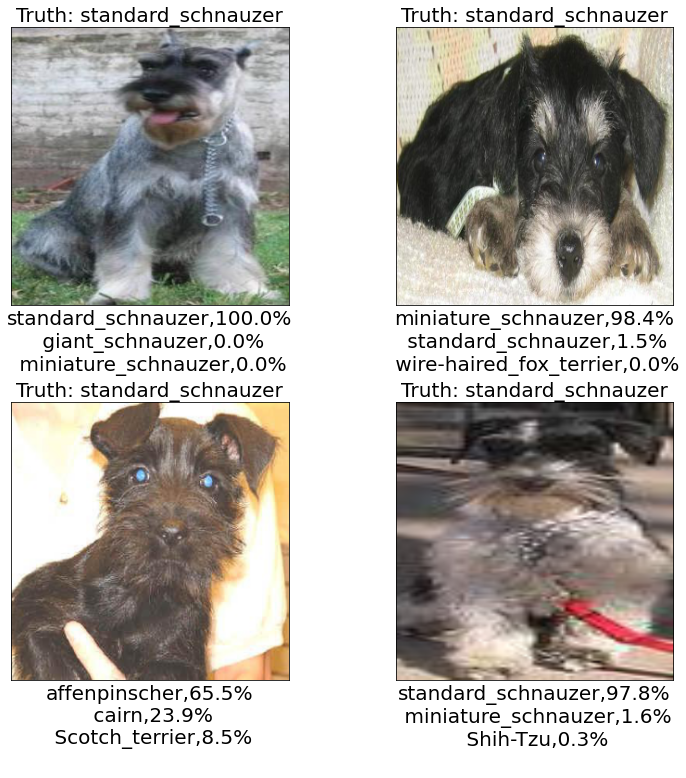

In [179]:
get_predict_images_fr_validation(1972,1976,20)

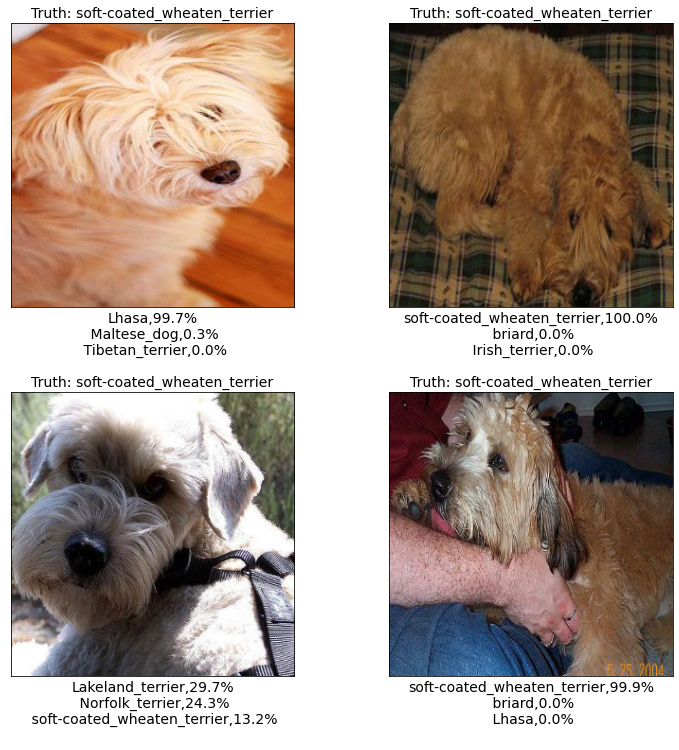

In [167]:
get_predict_images_fr_validation(1935,1939)

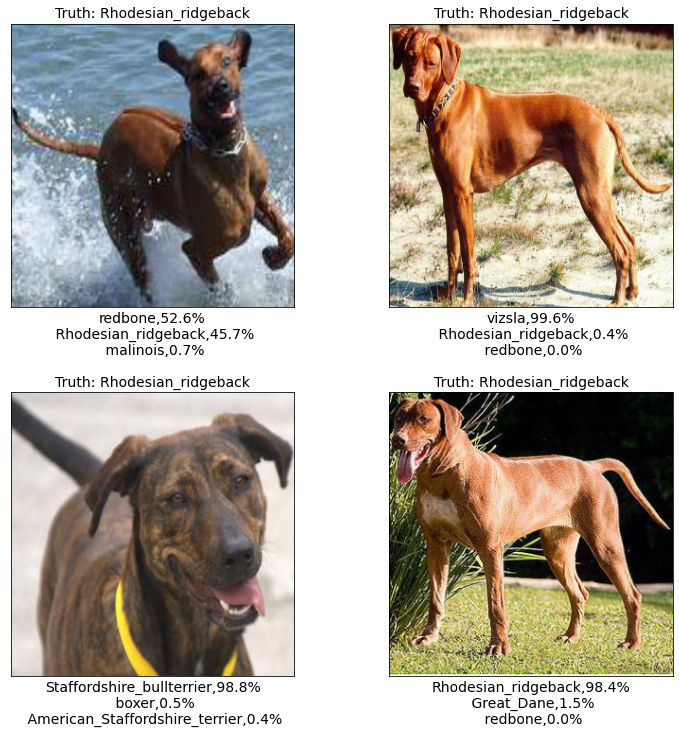

In [168]:
get_predict_images_fr_validation(931,935)

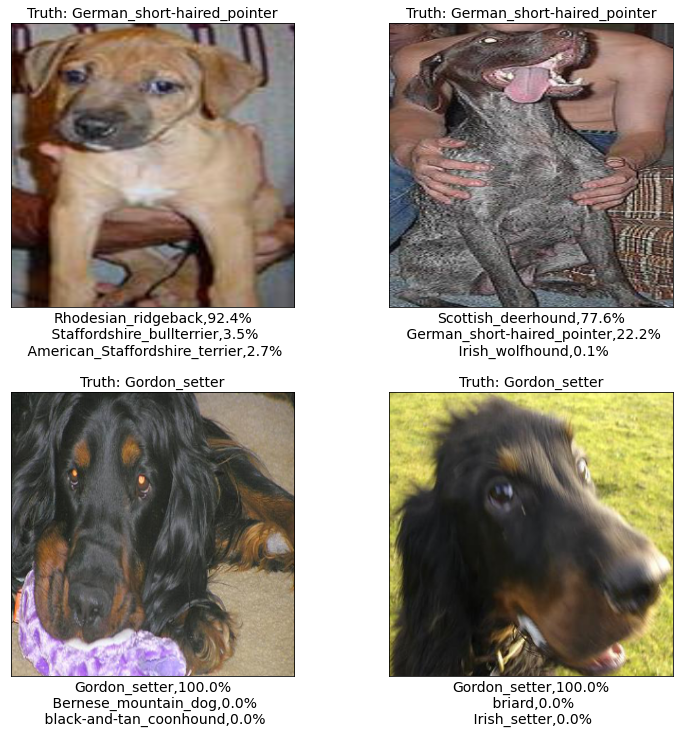

In [169]:
get_predict_images_fr_validation(460,464)

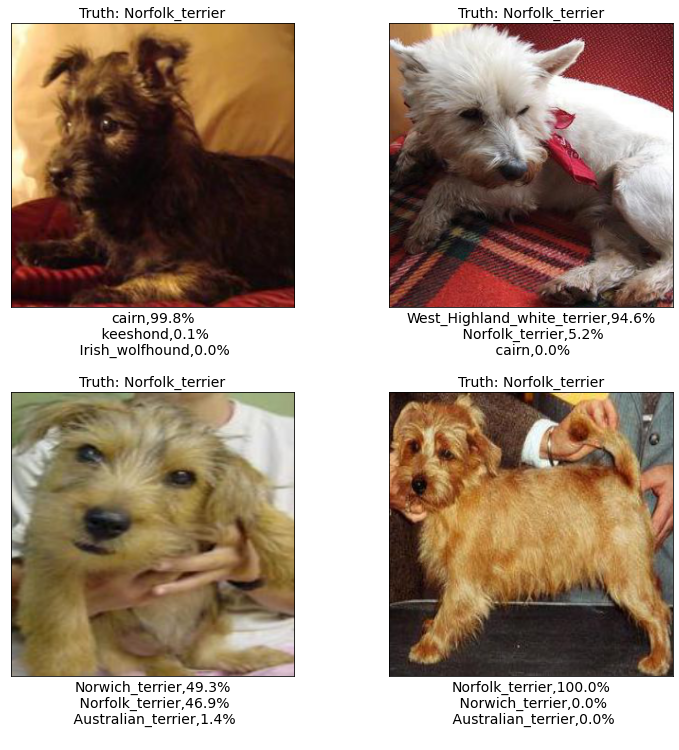

In [170]:
get_predict_images_fr_validation(809,813)

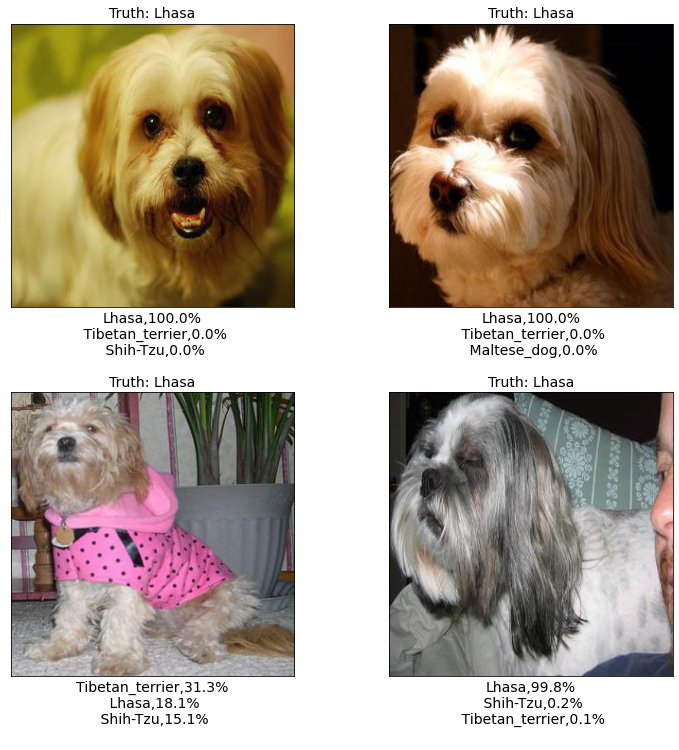

In [172]:
get_predict_images_fr_validation(740,744)

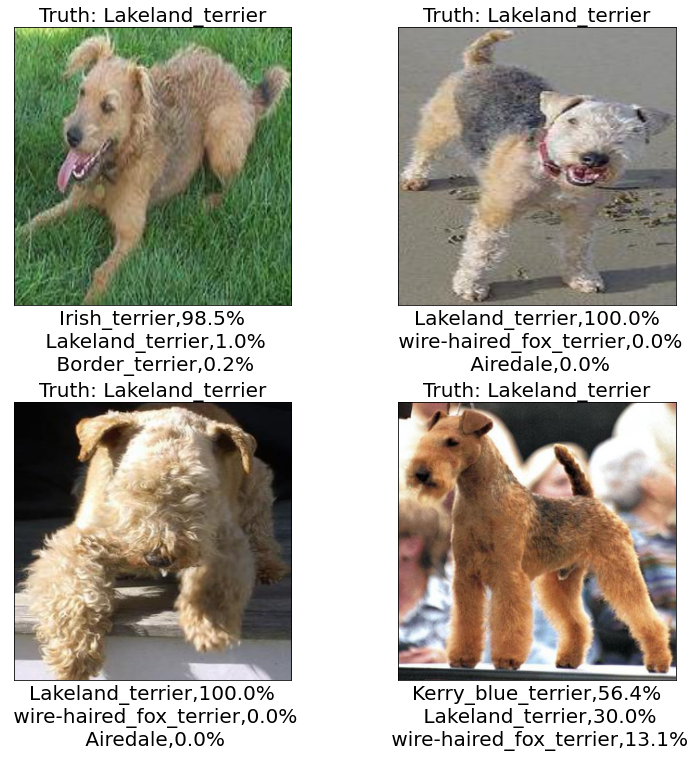

In [180]:
get_predict_images_fr_validation(705,709,20)

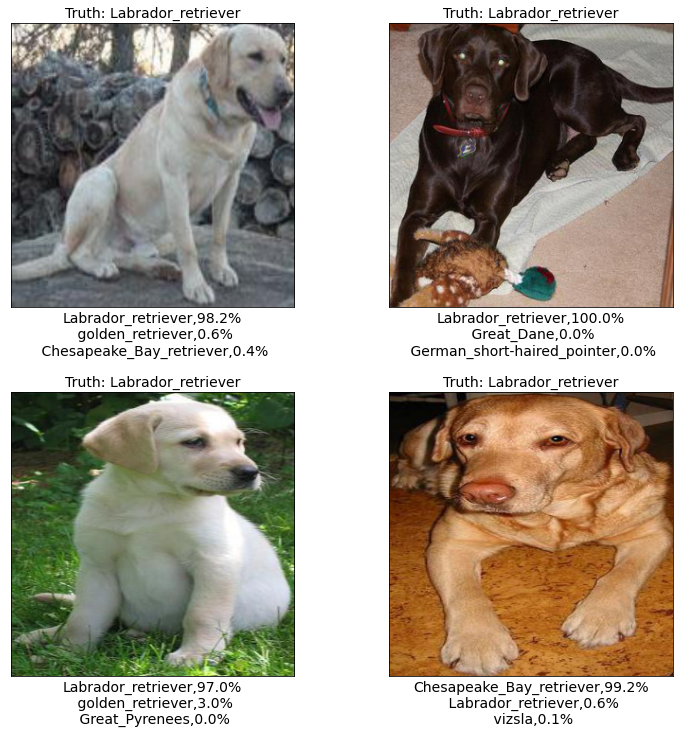

In [174]:
get_predict_images_fr_validation(696,700)

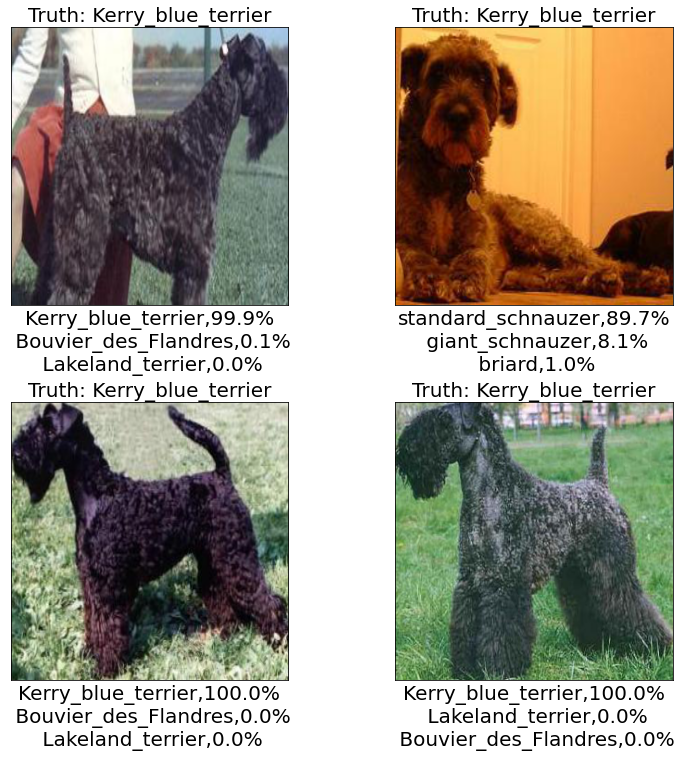

In [181]:
get_predict_images_fr_validation(666,670,20)